<a href="https://colab.research.google.com/github/kunal-git-002/Detectron-2/blob/master/pt3_keypoints_nultiple_person.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

finding keypoints for multilple instance or person in a single images






In [156]:
from google.colab.patches import cv2_imshow
import cv2
import pandas as pd

In [157]:

# install dependencies: 
!pip install pyyaml==5.1 pycocotools>=2.0.1
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
!gcc --version
# opencv is pre-installed on colab

1.6.0+cu101 True
gcc (Ubuntu 7.5.0-3ubuntu1~18.04) 7.5.0
Copyright (C) 2017 Free Software Foundation, Inc.
This is free software; see the source for copying conditions.  There is NO
warranty; not even for MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.



In [158]:
# install detectron2: (Colab has CUDA 10.1 + torch 1.6)
# See https://detectron2.readthedocs.io/tutorials/install.html for instructions
assert torch.__version__.startswith("1.6")
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.6/index.html

Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.6/index.html


In [159]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

In [178]:
img = cv2.imread("/content/drive/My Drive/imgs/wwe3.jpg")

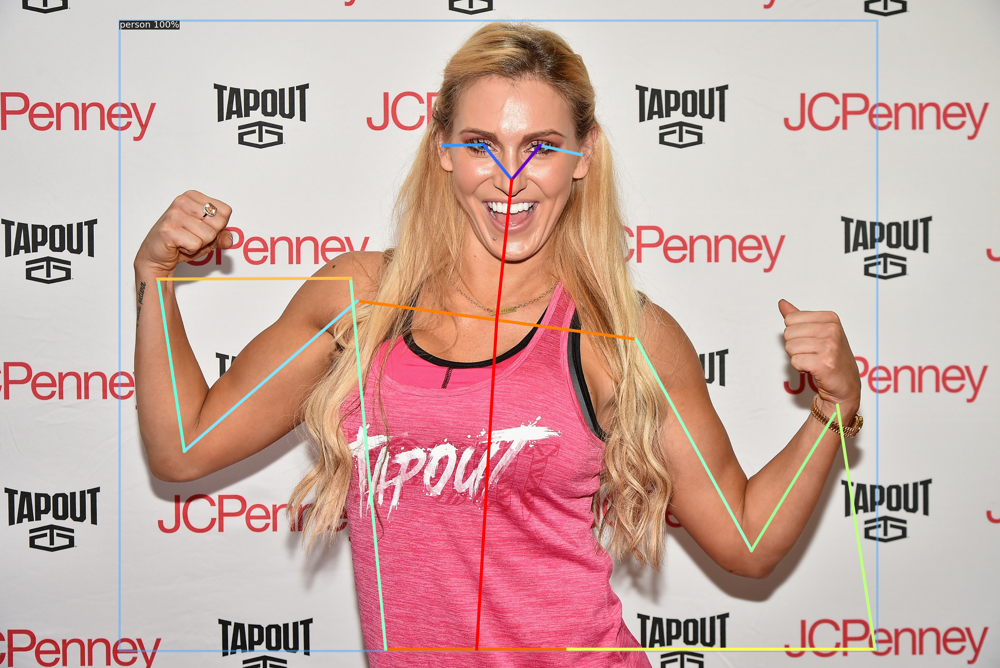

In [179]:
# Inference with a keypoint detection model
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Keypoints/keypoint_rcnn_R_50_FPN_3x.yaml"))
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7  # set threshold for this model
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Keypoints/keypoint_rcnn_R_50_FPN_3x.yaml")
predictor = DefaultPredictor(cfg)

outputs = predictor(img)#return a dictionaries

v = Visualizer(img[:,:,::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))

cv2_imshow(out.get_image()[:, :, ::-1])

In [180]:
outputs

ins=outputs["instances"]

ins.get_fields()#all info bbox,class,keypoints,conf score

{'pred_boxes': Boxes(tensor([[ 357.5259,   63.1442, 2621.3228, 1946.5188]], device='cuda:0')),
 'pred_classes': tensor([0], device='cuda:0'),
 'pred_keypoints': tensor([[[1.5294e+03, 5.3835e+02, 2.9849e+00],
          [1.6142e+03, 4.3608e+02, 6.4974e+00],
          [1.4445e+03, 4.3358e+02, 6.3752e+00],
          [1.7365e+03, 4.6352e+02, 1.7170e+00],
          [1.3247e+03, 4.3608e+02, 2.1629e+00],
          [1.9013e+03, 1.0148e+03, 3.2447e-01],
          [1.0676e+03, 9.0006e+02, 3.1964e-01],
          [2.2457e+03, 1.6459e+03, 5.1162e-01],
          [5.5096e+02, 1.3491e+03, 5.5297e-01],
          [2.4953e+03, 1.2368e+03, 9.9391e-01],
          [4.7359e+02, 8.4019e+02, 1.0303e+00],
          [1.6966e+03, 1.9403e+03, 2.8485e-01],
          [1.1525e+03, 1.9403e+03, 2.7068e-01],
          [2.6151e+03, 1.9403e+03, 9.2024e-02],
          [1.0476e+03, 8.3271e+02, 9.6813e-02],
          [2.5028e+03, 1.2119e+03, 4.6562e-01],
          [4.7109e+02, 8.3520e+02, 4.6853e-01]]], device='cuda:0'),
 'sc

***step 1 : getting all the information***

In [181]:

ins=outputs["instances"]#create output instance

op_data=ins.get_fields()#this return a all the imp data like, bboxes,confidence score,keypoints locations & classes

keypoints_data=op_data["pred_keypoints"]

#conversion of data into numpy array

#data is first moved to cpu and then converted to numpy array
keypoints_data = keypoints_data.cpu().data.numpy()

#now numpy array
keypoints_data=keypoints_data=np.array(keypoints_data)

In [182]:
keypoints_data.shape

(1, 17, 3)

In [183]:
n,k,_=keypoints_data.shape
#n=num of instanves
#k=num of keypoints per instances
#_=3 ,becz we have three values (x,y,visbility)

#indexes of human keypoints according Detectron 2 keypoints model
human_keypoints={0: 'nose',
 1: 'left_eye',
 2: 'right_eye',
 3: 'left_ear',
 4: 'right_ear',
 5: 'left_shoulder',
 6: 'right_shoulder',
 7: 'left_elbow',
 8: 'right_elbow',
 9: 'left_wrist',
 10: 'right_wrist',
 11: 'left_hip',
 12: 'right_hip',
 13: 'left_knee',
 14: 'right_knee',
 15: 'left_ankle',
 16: 'right_ankle'}

all_kps={}

for i in range(n):
  kps=keypoints_data[i]

  temp_dic={}
  for j in range(len(kps)):

    x,y,vis=kps[j]
    #x,y,vis=int(x),int(y),int(vis)
    temp_dic[j]=(human_keypoints[j],
                 (x,y))
  
  all_kps[i]=temp_dic
  
all_kps 

{0: {0: ('nose', (1529.3588, 538.3533)),
  1: ('left_eye', (1614.2201, 436.0773)),
  2: ('right_eye', (1444.4978, 433.5828)),
  3: ('left_ear', (1736.52, 463.5172)),
  4: ('right_ear', (1324.6936, 436.0773)),
  5: ('left_shoulder', (1901.2506, 1014.80963)),
  6: ('right_shoulder', (1067.6143, 900.061)),
  7: ('left_elbow', (2245.687, 1645.9272)),
  8: ('right_elbow', (550.9595, 1349.0774)),
  9: ('left_wrist', (2495.2788, 1236.8234)),
  10: ('right_wrist', (473.5861, 840.1921)),
  11: ('left_hip', (1696.5854, 1940.2825)),
  12: ('right_hip', (1152.4755, 1940.2825)),
  13: ('left_knee', (2615.0828, 1940.2825)),
  14: ('right_knee', (1047.647, 832.70856)),
  15: ('left_ankle', (2502.7664, 1211.8779)),
  16: ('right_ankle', (471.09015, 835.203))}}

***visulize the data***

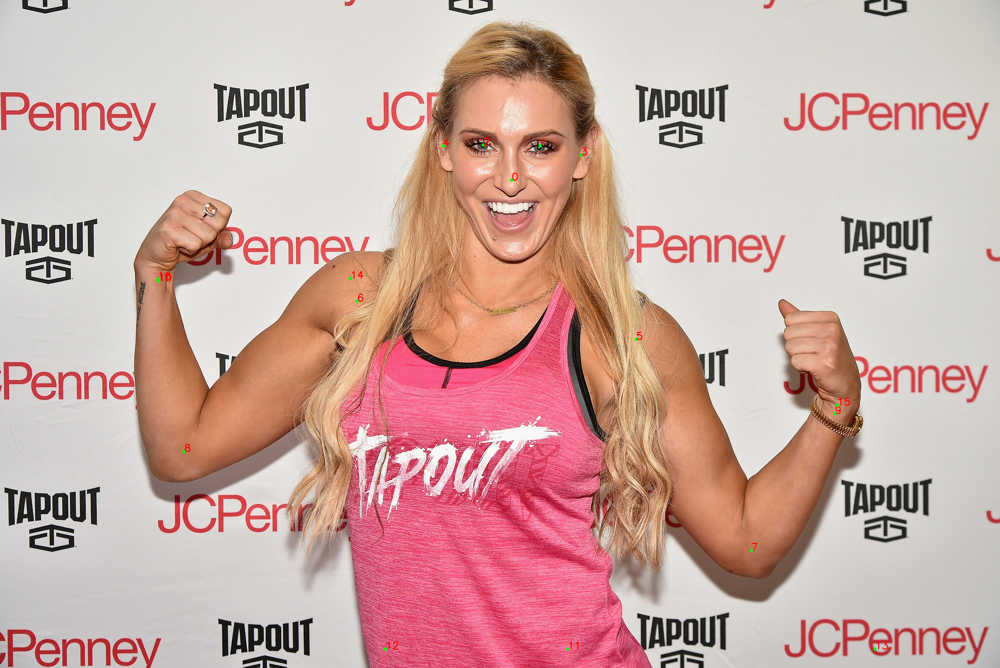

In [184]:
for i in range(n):

  ins=all_kps[i]

  for ind,val in ins.items():

    part,locs=val#return 3 values (human part,(x,y))
    x,y=locs
    x,y=int(x),int(y)

    cv2.circle(img,
               (x,y),
               5,
               (0,255,0),
               -1)
    
    cv2.putText(img,
                str(ind),
                (x,y),
                cv2.FONT_HERSHEY_SIMPLEX,
                1,
                (0,0,255),
                2)
    
    if ind==16:

      cv2_imshow(img)


remaining work continue on pt 4

> we dont consider visibility of keypoints

> data is not good to understable (convert pandas df)

> 2 na 3 ,5 na 6 person dekhay 6


